# Task 1 #



## 1.1: Creating the training, validation and test sets ##


In [1]:
%load_ext autoreload
%autoreload 2

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import math
import os
import ast

from pathlib import Path
from matplotlib.lines import Line2D
from scipy.stats import skew
from sklearn.preprocessing import PowerTransformer, StandardScaler, RobustScaler
from utilities.preprocessing import DataPreprocessor
from Scripts.Task_1 import (process_physionet_set, STATIC_VARS)


In [3]:
DATA_PATH = 'ml4h_data/p1'
SAVE_PATH = Path('output/processed_sets')
SAVE_PATH.mkdir(parents=True, exist_ok=True)

SET_LIST = ['a', 'b', 'c']
processed_dfs = []

for s in SET_LIST:
    df = process_physionet_set(
        set_name=s, 
        input_base_path=DATA_PATH, 
        output_base_path=SAVE_PATH
        )
    processed_dfs.append(df)


processed_dfs[0].head()

--- Processing Set: a ---
Total variables found: 45
Columns: Timestamp, ALP, ALT, AST, Age, Albumin, BUN, Bilirubin, Cholesterol, Creatinine, DiasABP, FiO2, GCS, Gender, Glucose, HCO3, HCT, HR, Height, ICUType, K, Label, Lactate, MAP, MechVent, Mg, NIDiasABP, NIMAP, NISysABP, Na, PaCO2, PaO2, PatientID, Platelets, RecordID, RespRate, SaO2, SysABP, Temp, TroponinI, TroponinT, Urine, WBC, Weight, pH

--- Processing Set: b ---
Total variables found: 45
Columns: Timestamp, ALP, ALT, AST, Age, Albumin, BUN, Bilirubin, Cholesterol, Creatinine, DiasABP, FiO2, GCS, Gender, Glucose, HCO3, HCT, HR, Height, ICUType, K, Label, Lactate, MAP, MechVent, Mg, NIDiasABP, NIMAP, NISysABP, Na, PaCO2, PaO2, PatientID, Platelets, RecordID, RespRate, SaO2, SysABP, Temp, TroponinI, TroponinT, Urine, WBC, Weight, pH

--- Processing Set: c ---
Total variables found: 45
Columns: Timestamp, ALP, ALT, AST, Age, Albumin, BUN, Bilirubin, Cholesterol, Creatinine, DiasABP, FiO2, GCS, Gender, Glucose, HCO3, HCT, HR, He

,Timestamp,ALP,ALT,AST,Age,Albumin,BUN,Bilirubin,Cholesterol,Creatinine,...,RespRate,SaO2,SysABP,Temp,TroponinI,TroponinT,Urine,WBC,Weight,pH
0,0,NaN,NaN,NaN,35.0,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,71.8,NaN
1,1,NaN,NaN,NaN,35.0,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,71.8,NaN
2,2,NaN,NaN,NaN,35.0,NaN,NaN,NaN,NaN,NaN,...,22.0,NaN,NaN,36.6,NaN,NaN,NaN,NaN,71.8,NaN
3,3,NaN,NaN,NaN,35.0,NaN,68.0,NaN,NaN,2.3,...,21.0,NaN,NaN,NaN,NaN,0.15,120.0,15.3,71.8,NaN
4,4,NaN,NaN,NaN,35.0,NaN,NaN,NaN,NaN,NaN,...,24.0,NaN,NaN,NaN,NaN,NaN,60.0,NaN,71.8,NaN


## 1.2: Exploratory Data Analysis ##
 

### All data points as i.i.d. ###

Here we plot the distribution of each variable, considering data points for time-series variables coming from the same patients as i.i.d. We also plot the distribution of the variables clustered by gender, age (10 years intervals) and mortality (our label).

The plots are saved as .pdf files in the output directory (`output/eda_training_set`) together with a `vars_types.txt` file that lists the variables based their type.

In [6]:
# Target directory
target_dir = 'output/eda_training_set'
if not os.path.exists(target_dir):
    os.makedirs(target_dir)

df = pd.read_parquet('output/processed_sets/processed_set_a.parquet')

# Data Cleaning
df['Gender'] = df['Gender'].replace({0.0: 'Female', 1.0: 'Male', -1.0: np.nan})
df['MechVent'] = df['MechVent'].replace({1.0: 'Yes', np.nan: 'Missing'})
df.loc[df['Weight'] == 0, 'Weight'] = np.nan


age_bins = range(0, 111, 10)
age_labels = [f"[{i}, {i+10})" for i in age_bins[:-1]]
df['Age_Bin'] = pd.cut(df['Age'], bins=age_bins, labels=age_labels, right=False)

exclude = [
    'Age_Bin',
    'Timestamp',
    'ICUType',
    'RecordID',
    'PatientID',
    'Label'
]

all_vars = sorted([c for c in df.columns if c not in exclude])

cat_vars = []
num_vars = []
for v in all_vars:
    if df[v].nunique() < 20 or df[v].dtype == 'object' or df[v].dtype.name == 'category':
        cat_vars.append(v)
    else:
        num_vars.append(v)

# Write the categorized variables to the file
file_path = os.path.join(target_dir, 'vars_types.txt')
with open(file_path, 'w') as f:
    f.write("--- CATEGORICAL / CODE VARIABLES ---\n")
    for v in sorted(cat_vars):
        f.write(f"- {v}\n")
    
    f.write("\n--- NUMERICAL VARIABLES ---\n")
    for v in sorted(num_vars):
        f.write(f"- {v}\n")

# Print the content of the variable types file 
print(f"Variable types saved to: {file_path}\n")
print("-" * 30)
with open(file_path, 'r') as f:
    print(f.read())
print("-" * 30)

Variable types saved to: output/eda_training_set/vars_types.txt

------------------------------
--- CATEGORICAL / CODE VARIABLES ---
- GCS
- Gender
- MechVent

--- NUMERICAL VARIABLES ---
- ALP
- ALT
- AST
- Age
- Albumin
- BUN
- Bilirubin
- Cholesterol
- Creatinine
- DiasABP
- FiO2
- Glucose
- HCO3
- HCT
- HR
- Height
- K
- Lactate
- MAP
- Mg
- NIDiasABP
- NIMAP
- NISysABP
- Na
- PaCO2
- PaO2
- Platelets
- RespRate
- SaO2
- SysABP
- Temp
- TroponinI
- TroponinT
- Urine
- WBC
- Weight
- pH

------------------------------


In [7]:
#  Save and show plots
def finalize_and_show(filename):
    plt.subplots_adjust(hspace=0.9, top=0.92, bottom=0.08)
    plt.savefig(os.path.join(target_dir, f'{filename}.pdf'), format='pdf', bbox_inches='tight')
    plt.show() 
    plt.close()

# Plots for variables clustered by gender, age and mortality (label)
def generate_clusters(split_col, file_name, skip_self=None):
    plt.figure(figsize=(24, 9 * rows))
    vars_to_plot = [v for v in all_vars if v != skip_self]
    
    for i, var in enumerate(vars_to_plot, 1):
        ax = plt.subplot(rows, cols, i)
        
        if var in STATIC_VARS:
            temp_df = df.groupby('PatientID')[[var, split_col]].first().dropna()
        else:
            temp_df = df[[var, split_col]].dropna()
            
        count = len(temp_df)
        unit = unit_map.get(var, '') # Unit is fetched here
        
        if split_col == 'Label':
            temp_df[split_col] = temp_df[split_col].map({0: 'Survived', 1: 'Dead'})
            order = ['Survived', 'Dead']
            palette = 'Set1'
            x_label = 'Outcome'
        elif split_col == 'Age_Bin':
            order = age_labels
            palette = 'viridis'
            x_label = 'Age'
        else:
            order = sorted(temp_df[split_col].unique())
            palette = 'Set2'
            x_label = split_col

        if var in cat_vars:
            sns.countplot(data=temp_df, x=var, hue=split_col, hue_order=order, palette=palette)
            plt.xlabel(f"{var} [{unit}]" if unit else var)
            plt.ylabel('Count') 
        else:
            sns.boxplot(data=temp_df, x=split_col, y=var, hue=split_col, 
                        palette=palette, order=order, showfliers=True)
            low, high = temp_df[var].quantile(0.01), temp_df[var].quantile(0.99)
            # if low != high:
            #     plt.ylim(low - abs(low*0.1), high + abs(high*0.1))
            
            # Use the unit for the y-axis in boxplots
            plt.ylabel(f"{var} [{unit}]" if unit else var)
            
        plt.xlabel(x_label)
        plt.title(f"{var} vs {x_label}", fontsize=14, pad=20)
        if split_col == 'Age_Bin': plt.xticks(rotation=45)
        ax.text(0.5, 1.04, f"Tot. num. of data points: {count}", 
                fontsize=10, ha='center', va='bottom', transform=ax.transAxes, color='gray')
                
    finalize_and_show(file_name)

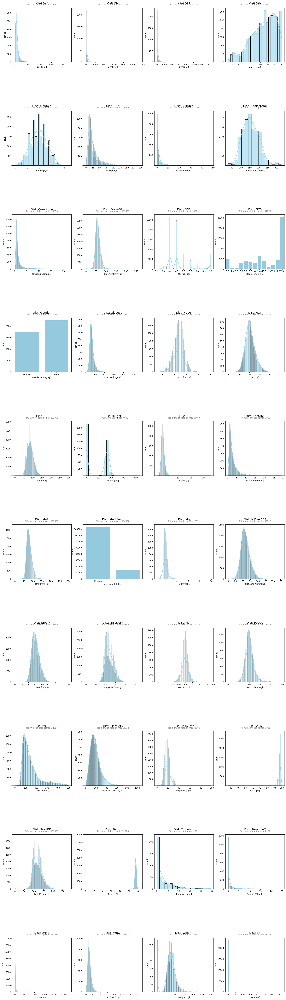

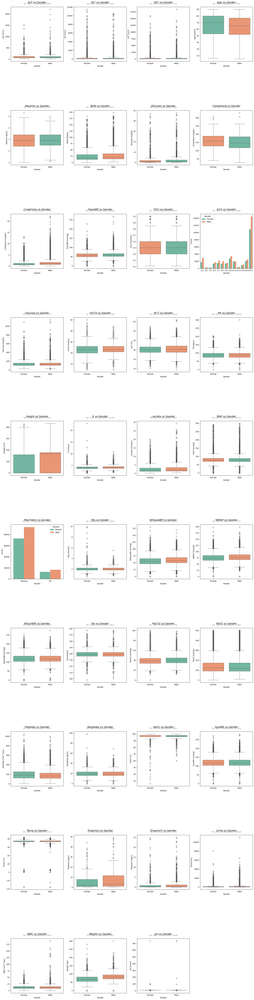

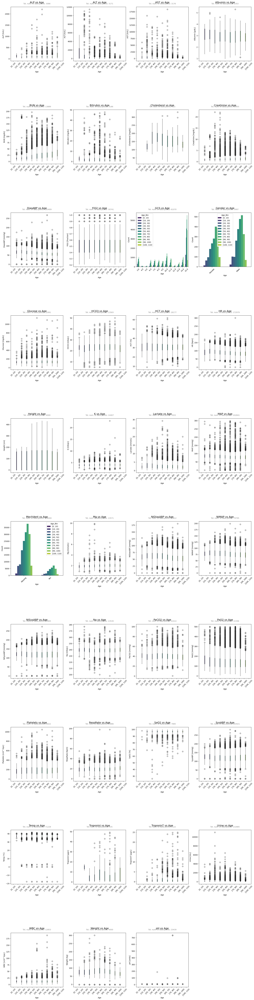

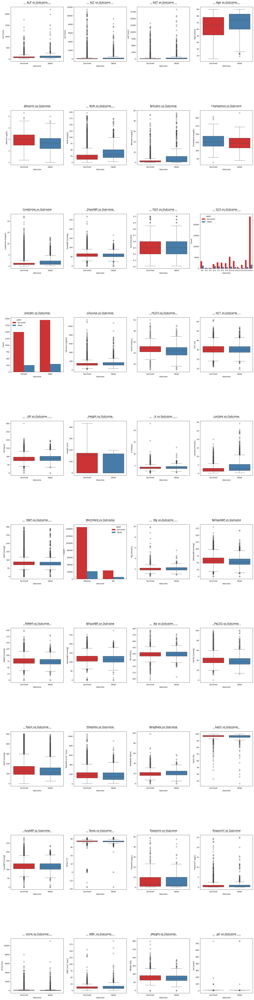

In [8]:
cols = 4
rows = math.ceil(len(all_vars) / cols)

# dict with units for each variable
unit_map = {
    'Age': 'years', 'Height': 'cm', 'Weight': 'kg',
    'Albumin': 'g/dL', 'ALP': 'IU/L', 'ALT': 'IU/L', 'AST': 'IU/L',
    'Bilirubin': 'mg/dL', 'BUN': 'mg/dL', 'Cholesterol': 'mg/dL',
    'Creatinine': 'mg/dL', 'DiasABP': 'mmHg', 'FiO2': 'fraction',
    'GCS': 'score (3-15)', 'Glucose': 'mg/dL', 'HCO3': 'mEq/L',
    'HCT': '%', 'HR': 'bpm', 'K': 'mEq/L', 'Lactate': 'mmol/L',
    'Mg': 'mmol/L', 'MAP': 'mmHg', 'Na': 'mEq/L', 'NIDiasABP': 'mmHg',
    'NIMAP': 'mmHg', 'NISysABP': 'mmHg', 'PaCO2': 'mmHg', 'PaO2': 'mmHg',
    'pH': 'units', 'Platelets': 'x10^3/µL', 'RespRate': 'bpm',
    'SaO2': '%', 'SysABP': 'mmHg', 'Temp': '°C', 'TroponinI': 'µg/L',
    'TroponinT': 'µg/L', 'Urine': 'mL', 'WBC': 'x10^3/µL',
    'Gender': 'category', 'ICUType': 'type', 'MechVent': 'status'
}



# Plot for individual distributions (time series data points considered i.i.d.) 
plt.figure(figsize=(24, 8 * rows))
for i, var in enumerate(all_vars, 1):
    ax = plt.subplot(rows, cols, i)
    
    # If variable is static, we group by PatientID to avoid counting the same value multiple times
    if var in STATIC_VARS:
        plot_data = df.groupby('PatientID')[var].first().dropna()
    else:
        plot_data = df[var].dropna()

    if plot_data.empty:
        plt.title(f"Dist: {var} (No Data)")
        continue
    
    count = len(plot_data)
    unit = unit_map.get(var, '')
    
    if var in cat_vars:
        sns.countplot(x=plot_data, color='skyblue', order=sorted(plot_data.unique()))
    else:
        plot_data = plot_data.replace([np.inf, -np.inf], np.nan).dropna()
        low, high = plot_data.quantile(0.01), plot_data.quantile(0.99)
        sns.histplot(plot_data, kde=True, color='skyblue')
        # if low != high:
        #     plt.xlim(low - abs(low*0.1), high + abs(high*0.1))
    
            
    plt.ylabel('count')
    plt.xlabel(f"{var} [{unit}]" if unit else var)
    plt.title(f"Dist: {var}", fontsize=14, pad=20)
    ax.text(0.5, 1.04, f"Tot. num. of data points: {count}", 
            fontsize=10, ha='center', va='bottom', transform=ax.transAxes, color='gray')

finalize_and_show('all_vars_distrib')
generate_clusters('Gender', 'vars_vs_gender', skip_self='Gender')
generate_clusters('Age_Bin', 'vars_vs_age', skip_self='Age')
generate_clusters('Label', 'mortality_vs_vars')

Aggregating mean values...
Aggregating min values...
Aggregating max values...
Aggregating first values...
Aggregating last values...
Generating Plots: MEAN vs Gender


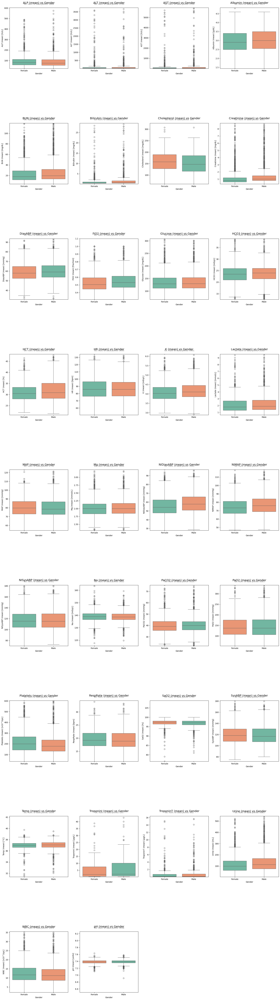

Generating Plots: MEAN vs Age_Bin


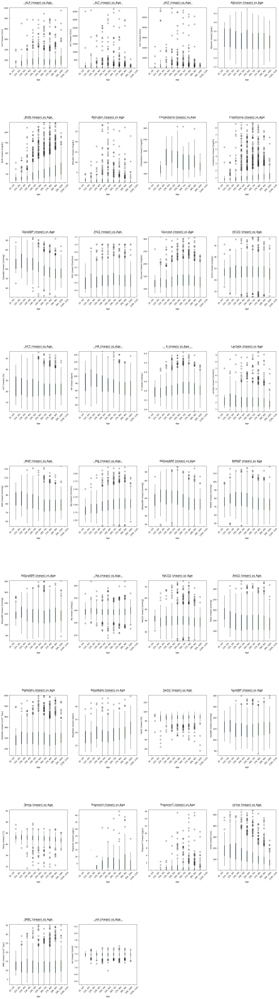

Generating Plots: MEAN vs Label


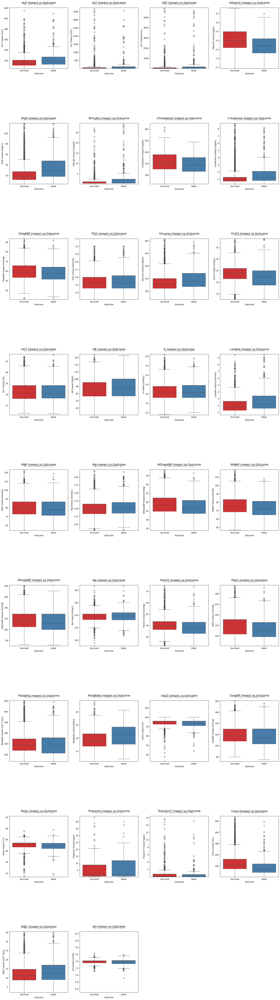

Generating Plots: MIN vs Gender


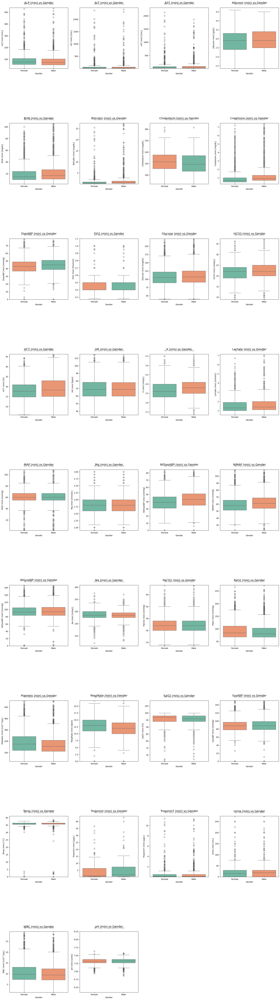

Generating Plots: MIN vs Age_Bin


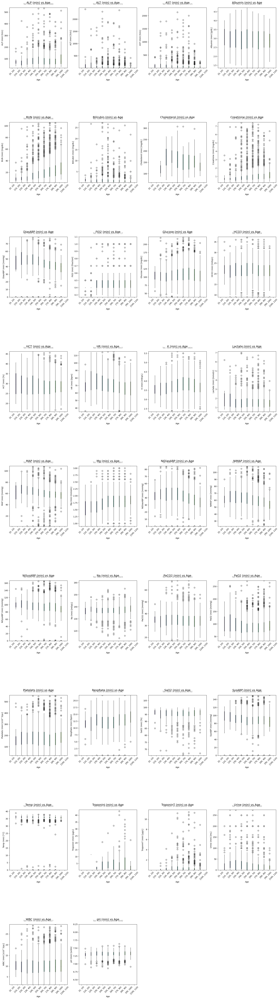

Generating Plots: MIN vs Label


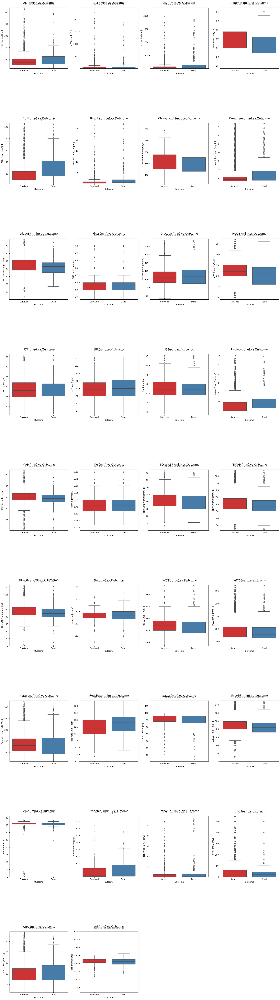

Generating Plots: MAX vs Gender


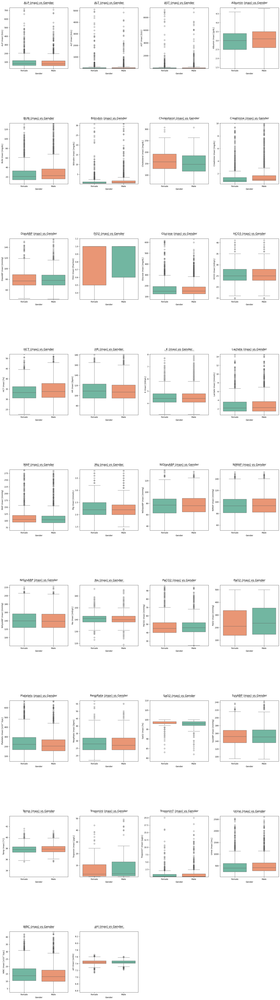

Generating Plots: MAX vs Age_Bin


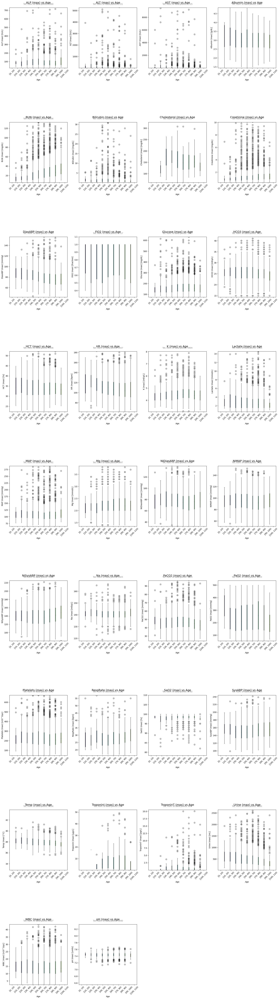

Generating Plots: MAX vs Label


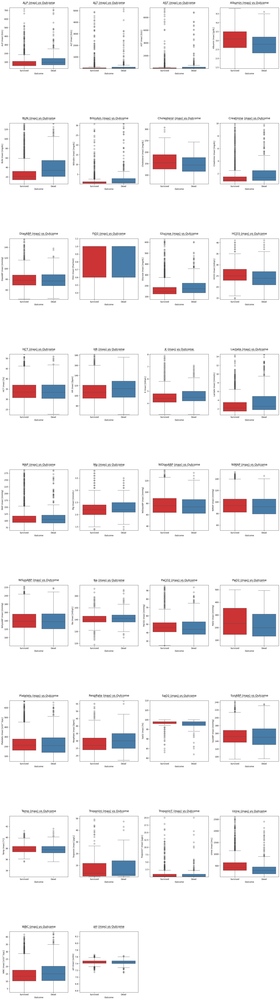

Generating Plots: FIRST vs Gender


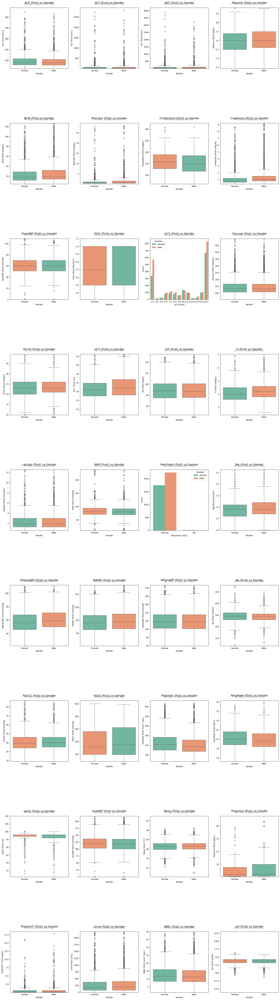

Generating Plots: FIRST vs Age_Bin


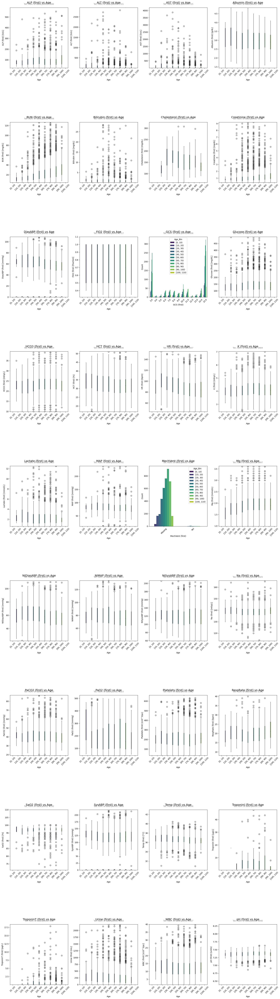

Generating Plots: FIRST vs Label


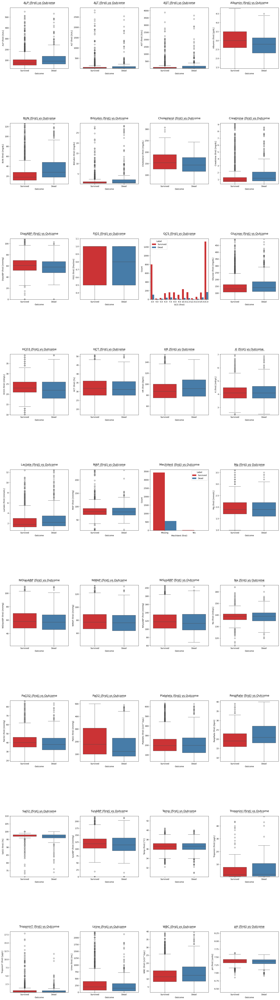

Generating Plots: LAST vs Gender


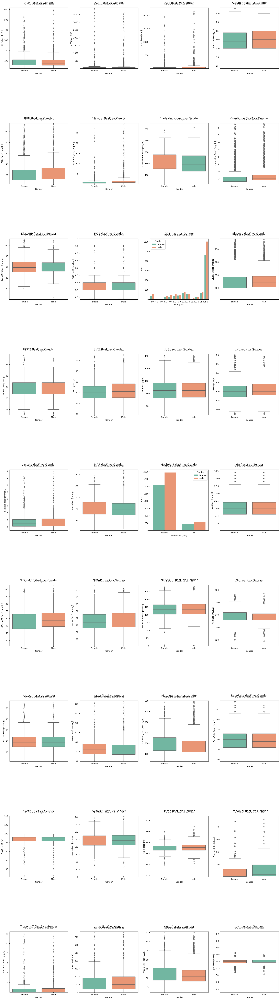

Generating Plots: LAST vs Age_Bin


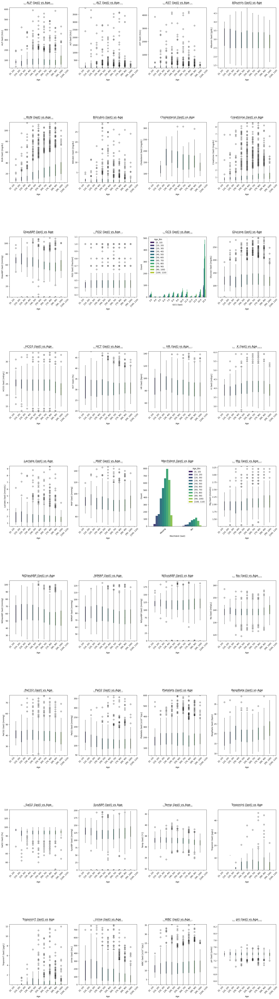

Generating Plots: LAST vs Label


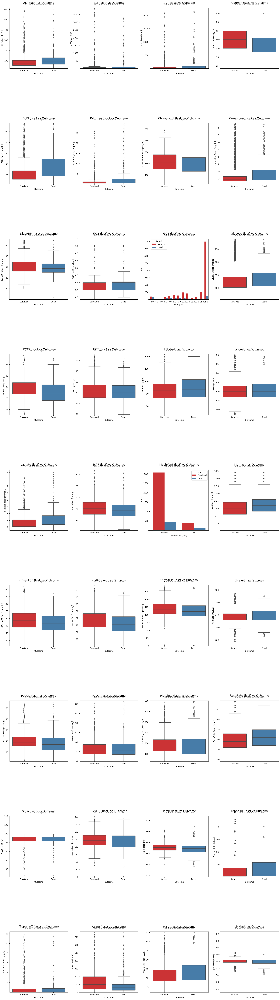

In [9]:
# Generate plots for aggregated time-series statistics (mean, min, max, first, last) clustered by gender, age and mortality (label)
def generate_aggregated_plots(agg_df, stat_name, cluster_col, vars_list):
    n_vars = len(vars_list)
    cols_count = 4
    rows_count = math.ceil(n_vars / cols_count)
    
    plt.figure(figsize=(24, 9 * rows_count))
    
    for i, var in enumerate(vars_list, 1):
        ax = plt.subplot(rows_count, cols_count, i)
        
        # Pre-process data and drop NaNs for this specific plot
        temp_df = agg_df[[var, cluster_col]].dropna()
        count = len(temp_df)
        unit = unit_map.get(var, '')
        
        # Define plotting parameters based on the cluster target
        if cluster_col == 'Label':
            plot_df = temp_df.copy()
            plot_df[cluster_col] = plot_df[cluster_col].map({0: 'Survived', 1: 'Dead'})
            order = ['Survived', 'Dead']
            palette = 'Set1'
            x_label = 'Outcome'
        elif cluster_col == 'Age_Bin':
            plot_df = temp_df
            order = age_labels 
            palette = 'viridis'
            x_label = 'Age'
        else: 
            plot_df = temp_df
            order = sorted(plot_df[cluster_col].unique())
            palette = 'Set2'
            x_label = cluster_col

        # --- THE FIX: Strictly separate Categorical vs Numerical logic ---
        if var in cat_vars:
            # Categorical variables: Use Countplot (No math/quantiles allowed)
            sns.countplot(data=plot_df, x=var, hue=cluster_col, hue_order=order, palette=palette)
            plt.ylabel('Count')
            plt.xlabel(f"{var} ({stat_name})")
        else:
            # Numerical variables: Use Boxplot and calculate Quantiles for axis limits
            sns.boxplot(data=plot_df, x=cluster_col, y=var, hue=cluster_col, 
                        palette=palette, order=order, showfliers=True)
            
            # This line caused the crash previously; it's now safe inside the 'else' block
            low, high = plot_df[var].quantile(0.01), plot_df[var].quantile(0.99)
            if low != high:
                plt.ylim(low - abs(low*0.1), high + abs(high*0.1))
            
            y_label = f"{var} ({stat_name})"
            if unit: 
                y_label += f" [{unit}]"
            plt.ylabel(y_label)
            plt.xlabel(x_label)

        # Common formatting for all plot types
        plt.title(f"{var} ({stat_name}) vs {x_label}", fontsize=14, pad=20)
        
        if cluster_col == 'Age_Bin':
            plt.xticks(rotation=45)
            
        ax.text(0.5, 1.04, f"Tot. num. of data points: {count}", 
                fontsize=10, ha='center', va='bottom', transform=ax.transAxes, color='gray')

    finalize_and_show(f"agg_{stat_name}_vs_{cluster_col.lower()}")

# Define the statistics of interest
stats_to_compute = {
    'mean': 'mean',
    'min': 'min',
    'max': 'max',
    'first': 'first',
    'last': 'last'
}

# keep only dynamic variables 
ts_vars = sorted([v for v in all_vars if v not in STATIC_VARS])
ts_vars_numeric = [v for v in ts_vars if v in num_vars]
ts_vars_categorical = [v for v in ts_vars if v in cat_vars]

patient_meta = df.groupby('PatientID')[['Gender', 'Age_Bin', 'Label']].first()

agg_data = {}
for name, func in stats_to_compute.items():
    print(f"Aggregating {name} values...")
    
    if name in ['first', 'last']:
        # For first/last, keep categorical data 
        agg_val = df.groupby('PatientID')[ts_vars].agg(func)
    else:
        # For mean/min/max, ONLY use numeric columns
        agg_val = df.groupby('PatientID')[ts_vars_numeric].agg(func)
    
    agg_data[name] = agg_val.join(patient_meta)


cluster_targets = ['Gender', 'Age_Bin', 'Label']
for stat_name in stats_to_compute.keys():
    for target in cluster_targets:
        current_vars = ts_vars if stat_name in ['first', 'last'] else ts_vars_numeric
        print(f"Generating Plots: {stat_name.upper()} vs {target}")
        generate_aggregated_plots(agg_data[stat_name], stat_name, target, current_vars)

In [10]:
processed_datasets = Path('output/processed_sets')
df_a = pd.read_parquet(processed_datasets/ 'processed_set_a.parquet')
# Check the average of the pH column
print(f"Mean pH in current DF: {df_a['pH'].mean()}")
true_outlier_data = df_a[(df_a['pH'] < 6.5) | (df_a['pH'] > 8.5)].copy()

print(f"True biological outliers found: {len(true_outlier_data)}")

if len(true_outlier_data) > 0:
    print("\nBreakdown of specific pH outlier values:")
    print("------------------------------------------")
    # Show PatientID and Timestamp so you can trace these back to the raw files
    display_cols = ['PatientID', 'Timestamp', 'pH']
    
    # Sorting by pH so you see the lowest and highest extremes clearly
    print(true_outlier_data[display_cols].sort_values(by='pH').to_string(index=False))
else:
    print("No biological outliers found in the [6.5, 8.5] range.")

Mean pH in current DF: 7.490983403728828
True biological outliers found: 10

Breakdown of specific pH outlier values:
------------------------------------------
 PatientID  Timestamp    pH
    138889          2   1.0
    136802         22   3.0
    141938          2  94.0
    133473         37  95.0
    140287         27  96.0
    135020          4 100.0
    141680          9 187.0
    142564         15 733.0
    140525         20 734.0
    140525         23 735.0


In [11]:
# Filter for heights between -1 and 50 
df_static = df_a.groupby('PatientID')[['Height', 'Age', 'Gender']].first().reset_index()

# Remap gender to string correctly instead of float
df_static['Gender'] = df_static['Gender'].map({0: 'Female', 1: 'Male'})

height_outliers = df_static[df_static['Height'].notna()]
height_outliers = height_outliers[(height_outliers['Height'] >= -1) & (height_outliers['Height'] <= 50)]

total_outliers = len(height_outliers)

value_age_analysis = height_outliers.groupby(['Height', 'Age', 'Gender']).agg(
    occurrences=('PatientID', 'size'),
    patient_ids=('PatientID', lambda x: list(x))
).reset_index()

print(f"Analysis of Height Outliers in Set A:")
print(f"----------------------------------------------")
print(f"Total data points found: {total_outliers}")
print(f"\nBreakdown of specific values found with Patient IDs:")

imputation_path = Path('output/eda_training_set/imputation/')
imputation_path.mkdir(parents=True, exist_ok=True)
height_outliers_path_a = imputation_path / 'height_outliers_analysis_a.csv'

# Use to_string to ensure the lists aren't truncated in the console
print(value_age_analysis.to_string(index=False))
value_age_analysis.to_csv(height_outliers_path_a, index=False)

Analysis of Height Outliers in Set A:
----------------------------------------------
Total data points found: 1903

Breakdown of specific values found with Patient IDs:
 Height  Age Gender  occurrences                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                      patient_ids
   -1.0 15.0   Male            1                                                                                                                                                                                                                                                             

In [12]:
# Filter for weights between -1 and 15 kg
df_static = df_a.groupby('PatientID')[['Weight', 'Age', 'Gender']].first().reset_index()

# Remap gender to string correctly instead of float
df_static['Gender'] = df_static['Gender'].map({0: 'Female', 1: 'Male'})

weight_outliers = df_static[df_static['Weight'].notna()]

# Changed >= 0 to >= -1
weight_outliers = weight_outliers[(weight_outliers['Weight'] >= -1) & (weight_outliers['Weight'] <= 15)]

total_outliers = len(weight_outliers)

# Aggregate with Patient IDs
value_age_analysis = weight_outliers.groupby(['Weight', 'Age', 'Gender']).agg(
    occurrences=('PatientID', 'size'),
    patient_ids=('PatientID', lambda x: list(x))
).reset_index()

print(f"Analysis of Weight Outliers (-1 to 15 kg) in Set A:")
print(f"-------------------------------------------------")
print(f"Total data points found: {total_outliers}")
print(value_age_analysis.to_string(index=False))

# Calculate how many of these are the -1.0 placeholder
missing_placeholders = (weight_outliers['Weight'] == -1).sum()
print(f"\nNumber of '-1.0' missing value placeholders: {missing_placeholders}")

weight_outliers_path_a = imputation_path / 'weight_outliers_analysis_a.csv'

value_age_analysis.to_csv(weight_outliers_path_a, index=False)

Analysis of Weight Outliers (-1 to 15 kg) in Set A:
-------------------------------------------------
Total data points found: 326
 Weight  Age Gender  occurrences                                                                                                              patient_ids
   -1.0 19.0 Female            2                                                                                                         [135677, 135980]
   -1.0 19.0   Male            2                                                                                                         [140261, 141875]
   -1.0 20.0 Female            1                                                                                                                 [139385]
   -1.0 20.0   Male            1                                                                                                                 [134915]
   -1.0 21.0 Female            1                                                                   

In [13]:
# Plausible ranges and vitals
physiologically_plausible = {
    'Albumin': [0.1, 10.0],       'ALP': [0, 10000],           'ALT': [0, 20000],
    'AST': [0, 20000],           'Bilirubin': [0, 150],       'BUN': [0.5, 300],
    'Cholesterol': [10, 1000],   'Creatinine': [0.05, 40],    'DiasABP': [1, 300],
    'FiO2': [0.21, 1.0],        'GCS': [3, 15],              'Glucose': [5, 2000],
    'HCO3': [2, 100],            'HCT': [5, 90],              'HR': [0, 250],
    'K': [0.5, 15.0],            'Lactate': [0.1, 50],        'Mg': [0.1, 20.0],
    'MAP': [1, 300],             'Na': [80, 210],             'PaCO2': [5, 250],
    'PaO2': [5, 800],            'pH':[6.3, 8.2],             'Platelets': [1, 3000],      
    'RespRate': [1, 150],        'SaO2': [0, 100],           'SysABP': [1, 400],         
    'Temp': [30, 44],            'Urine': [0, 10000],         'WBC': [0, 500]
}

df_report_source = df_a.sort_values(by=['PatientID', 'Timestamp']).copy()
all_outlier_records = []
summary_stats = []
for var, (min_val, max_val) in physiologically_plausible.items():
    if var in df_report_source.columns:
        # Extract columns safely from our copy
        temp_df = df_report_source[['PatientID', 'Timestamp', var]].copy()
        
        # Search ahead for the next available non-NaN value
        temp_df['Next_Valid'] = temp_df.groupby('PatientID')[var].bfill().shift(-1)
        temp_df['Next_Value'] = temp_df.groupby('PatientID')[var].shift(-1)
        temp_df['Prev_Value'] = temp_df.groupby('PatientID')[var].shift(1)
        
        # Detect Outliers
        var_outliers = temp_df[(temp_df[var] < min_val) | (temp_df[var] > max_val)].copy()
        
        if not var_outliers.empty:
            summary_stats.append({
                'Variable': var, 'Outliers': len(var_outliers), 
                'Min': var_outliers[var].min(), 'Max': var_outliers[var].max()
            })
            
            # Vectorized Plausibility: It is Plausible ONLY if it DOES NOT return to normal
            var_outliers['Plausible'] = ~var_outliers['Next_Valid'].between(min_val, max_val)
            
            var_outliers['Variable_Name'] = var
            var_outliers = var_outliers.rename(columns={var: 'Value'})
            all_outlier_records.append(var_outliers)
if all_outlier_records:
    df_report = pd.concat(all_outlier_records, ignore_index=True)
    df_report = df_report.sort_values(by=['PatientID', 'Variable_Name', 'Timestamp'])
    
    # Clean report columns (Outcome removed)
    report_cols = ['PatientID', 'Variable_Name', 'Timestamp', 'Value', 'Prev_Value', 'Next_Value', 'Plausible']
    df_report = df_report[report_cols]
    print("\n--- Outlier Plausibility Report ---")
    h_fmt = "{:<8} | {:<12} | {:<4} | {:<8} | {:<12} | {:<10} | {:<8}"
    r_fmt = "{:<8} | {:<12} | {:<4} | {:<8.2f} | {:<12} | {:<10} | {:<8}"
    header = h_fmt.format("ID", "Var", "TS", "Val", "PreviousVal", "NextVal", "Plausible")
    print(header)
    print("=" * len(header))
    
    for _, row in df_report.iterrows():
        p_val = f"{row['Prev_Value']:<12.2f}" if pd.notnull(row['Prev_Value']) else "NaN"
        n_val = f"{row['Next_Value']:<10.2f}" if pd.notnull(row['Next_Value']) else "NaN"
        
        print(r_fmt.format(
            row['PatientID'], row['Variable_Name'], row['Timestamp'], 
            row['Value'], p_val, n_val, str(row['Plausible'])
        ))
    outlier_csv_path_a = imputation_path / 'outlier_report_a.csv'
    df_report.to_csv(outlier_csv_path_a, index=False)
    print(f"\nReport saved to: {outlier_csv_path_a}")


--- Outlier Plausibility Report ---
ID       | Var          | TS   | Val      | PreviousVal  | NextVal    | Plausible
132584   | DiasABP      | 5    | 0.00     | NaN          | NaN        | False   
132584   | SysABP       | 5    | 0.00     | NaN          | NaN        | False   
132592   | RespRate     | 37   | 0.00     | 14.00        | NaN        | False   
132614   | DiasABP      | 4    | 0.00     | NaN          | 0.00       | True    
132614   | DiasABP      | 5    | 0.00     | 0.00         | 52.00      | False   
132614   | MAP          | 4    | 0.00     | NaN          | NaN        | False   
132614   | SysABP       | 4    | 0.00     | NaN          | 0.00       | True    
132614   | SysABP       | 5    | 0.00     | 0.00         | 124.00     | False   
132615   | DiasABP      | 1    | 0.00     | NaN          | 71.00      | False   
132615   | SysABP       | 1    | 0.00     | NaN          | 137.00     | False   
132618   | DiasABP      | 1    | 0.00     | NaN          | NaN        |

In [14]:
# Calculate skewness for all numeric columns
skewness_series = df_a.select_dtypes(include=[np.number]).skew()

# Filter for variables with skew < -1 or > 1
highly_skewed = skewness_series[(skewness_series < -1) | (skewness_series > 1)]
highly_skewed = highly_skewed.sort_index()

print(f"{'Variable':<15} | {'Skew Value':<10}")
print("-" * 28)

# Print variables that meet the skew criteria
for var, val in highly_skewed.items():
    print(f"{var:<15} | {val:<10.4f}")

if highly_skewed.empty:
    print("No variables found with skewness < -1 or > 1.")

Variable        | Skew Value
----------------------------
ALP             | 6.3612    
ALT             | 5.3077    
AST             | 5.3538    
BUN             | 2.3711    
Bilirubin       | 4.0675    
Creatinine      | 3.9224    
FiO2            | 1.4376    
Glucose         | 4.2459    
K               | 2.9547    
Label           | 2.0931    
Lactate         | 3.0281    
MAP             | 2.1105    
Mg              | 2.6052    
PaCO2           | 1.3115    
PaO2            | 1.7381    
Platelets       | 1.5951    
SaO2            | -8.1540   
Temp            | -19.8058  
TroponinI       | 2.1403    
TroponinT       | 4.6049    
Urine           | 11.4079   
WBC             | 5.5142    
pH              | 83.8978   


**Observations:**
1. The variables `Gender`, `ICUType` and the label are categorical, `GCS` is a code (numerical ordinal) and the others are all numeric.

2. The following variables have a skewness of <-1 or >1: `ALP`, `ALT`, `AST`, `BUN`, `Bilirubin`, `Creatinine`, `FiO2`, `Glucose`, `K`, `Label`, `Lactate`, `MAP`, `Mg`, `PaCO2`, `PaO2`, `Platelets`, `SaO2`, `Temp`, `TroponinI`, `TroponinT`, `Urine`, `WBC`, `pH`.

3. Several variables contain outliers, but not all are realistic data points. For example, there are several patients with a `Height` or `Weight` of -1.0, which is to be interpreted as a placeholder for missing data. Other variables, such as `pH`, contain both erroneous measurements, like 1.0, 3.0, 94.0 etc., but also mistaken entries like 733.0, 734.0 and 735.0, which likely stand for 7.33, 7.34 and 7.35, especially when considering the previous/following timestamps. Also `Height` has some values that probably represent wrong entries: 1.8, 13.0, etc.

**Demographics:** 
1. Gender: the plots show that there are no substantial differences in the values of the biomarkers between males and females and that both populations tend to have the same mean values and similar inter-quartile ranges. The only significant difference seems to involve the weight, as expected.
2. Age: the inter-quartile ranges across all age groups are comparable for most of the biomarkers, with some exceptions: people of age between 10 and 20 tend to have higher levels of `SAO2` and `TroponinI`compared to older cohorts.


Last, we check that the training, validation and test data have the same distributions for each variable, to check for out-of distribution variables. As it turns out, the datasets come from the same distribution.

Generating unit-aware comparison plots...


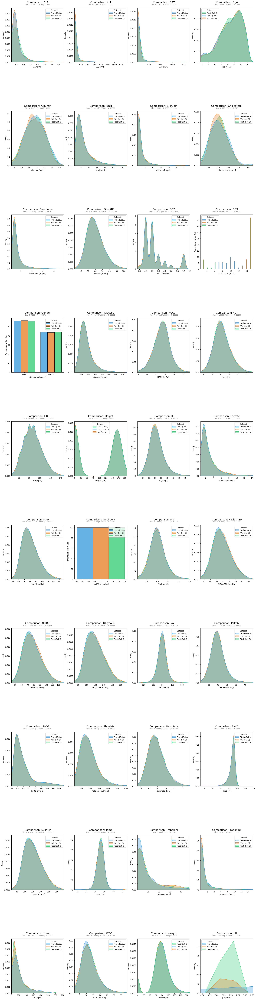

In [15]:
def plot_cross_dataset_comparison(vars_list, filename):
    n_vars = len(vars_list)
    cols_count = 4
    rows_count = math.ceil(n_vars / cols_count)
    
    plt.figure(figsize=(24, 9 * rows_count))
    palette = {'Train (Set A)': '#3498db', 'Val (Set B)': '#e67e22', 'Test (Set C)': '#2ecc71'}

    for i, var in enumerate(vars_list, 1):
        ax = plt.subplot(rows_count, cols_count, i)
        
        if var in STATIC_VARS:
            plot_data = combined_df.groupby(['Dataset', 'PatientID'])[var].first().reset_index()
        else:
            plot_data = combined_df[['Dataset', var]].dropna()
        
        counts = plot_data['Dataset'].value_counts()
        count_str = " | ".join([f"{k[0]}: {v}" for k, v in counts.items()])

        # Get unit for label
        unit = unit_map.get(var, '')
        x_label = f"{var} [{unit}]" if unit else var

        if var in cat_vars:
            cat_order = sorted([str(x) for x in plot_data[var].unique() if pd.notna(x)])            
            sns.histplot(
                data=plot_data, x=var, hue='Dataset', 
                multiple="dodge", shrink=.8, palette=palette,
                stat="percent", common_norm=False, hue_order=list(palette.keys())
            )
            plt.ylabel('Percentage within Set')
        else:
            sns.kdeplot(
                data=plot_data, x=var, hue='Dataset', 
                fill=True, palette=palette, common_norm=False, alpha=0.3
            )
            train_vals = plot_data[plot_data['Dataset'] == 'Train (Set A)'][var]
            low, high = train_vals.quantile(0.01), train_vals.quantile(0.99)
            if low != high:
                plt.xlim(low - abs(low*0.1), high + abs(high*0.1))
            plt.ylabel('Density')

        plt.xlabel(x_label)
        plt.title(f"Comparison: {var}", fontsize=14, pad=25)
        ax.text(0.5, 1.04, f"Obs: {count_str}", 
                fontsize=9, ha='center', va='bottom', transform=ax.transAxes, color='gray')

    finalize_and_show(filename)


files = {
    'Train (Set A)': 'output/processed_sets/processed_set_a.parquet',
    'Val (Set B)': 'output/processed_sets/processed_set_b.parquet',
    'Test (Set C)': 'output/processed_sets/processed_set_c.parquet'
}

# Create new directory for the cross-dataset comparison plots
target_dir = 'output/cross_dataset_comparison'
if not os.path.exists(target_dir):
    os.makedirs(target_dir)

dfs = []
for label, path in files.items():
    if os.path.exists(path):
        _df = pd.read_parquet(path)
        _df['Dataset'] = label
        _df['Gender'] = _df['Gender'].replace({0.0: 'Female', 1.0: 'Male', -1.0: np.nan})
        if 'Weight' in _df.columns:
            _df.loc[_df['Weight'] == 0, 'Weight'] = np.nan
        dfs.append(_df)

combined_df = pd.concat(dfs, ignore_index=True)


print("Generating unit-aware comparison plots...")
plot_cross_dataset_comparison(all_vars, 'dataset_comparison_units')

## 1.3: Preprocessing ##

### Outlier Handling and Missing Value Imputation

We apply the following pipeline for handling outliers and missing values via the [DataPreprocessor](cci:2://file:///Users/lorenzofrigoli/Documents/UZH/MSc/ML_for_HC/ML4HC_Project1/utilities/data_processor.py) class:

- We fix known unit entry errors, such as converting `Height` incorrectly given in `dm` or `m` to `cm`, and correcting `pH` scaling mistakes.
- We evaluate physiological plausibility for biomarker variables using predefined clinical bounds. Any value falling outside these bounds is flagged as an outlier and masked as a missing value (`NaN`).
- We compute aggregate median dictionaries based strictly on the training set. These are mapped by `Gender` and 10-year `AgeBin` cohorts:
  - `first_val_medians`: The medians at the first timestamp.
  - `global_medians`: The overall medians across all timestamps.
- Missing values and newly masked outliers are handled together via a robust, cascading imputation strategy:
  1. We apply forward-filling (`ffill`) grouped by `PatientID` to propagate the last known valid physiological state.
  2. For missing values at the *first* timestamp or where forward-filling fails, we fall back to the cohort-specific `first_val_medians`.
  3. If a cohort's first-value median is unavailable (e.g., missing gender), we refer to the cohort-specific `global_medians`.
  4. As a final safety net, we fall back to the global column median across the entire training dataset.

### Data Scaling

For data scaling, we apply:

- Yeo-Johnson transform and `RobustScaler` (from *scikit-learn*) to numerical variables dynamically identified as highly skewed (skewness < `-1` or > `1`).
- Z-score normalization (`StandardScaler`) to all remaining numerical variables.
- One-hot encoding for categorical variables (such as `Gender` and `ICUType`), dropping the first category to avoid multicollinearity.

To strictly prevent data leakage, the exact processing structure—including the exact outlier bounds, the A-derived hierarchical median dictionaries, the skewed/normal column designations, and the fitted scaler parameters—are preserved in the class instance and deterministically applied to transform external datasets `b` and `c`.



In [16]:
# Fit and Transform on Training Set A
preprocessor = DataPreprocessor(impute_outliers=True, impute_missing=True, encode_cat=True)
print("Fitting and transforming Dataset A...")
df_a_processed = preprocessor.fit_transform(df_a)

Fitting and transforming Dataset A...


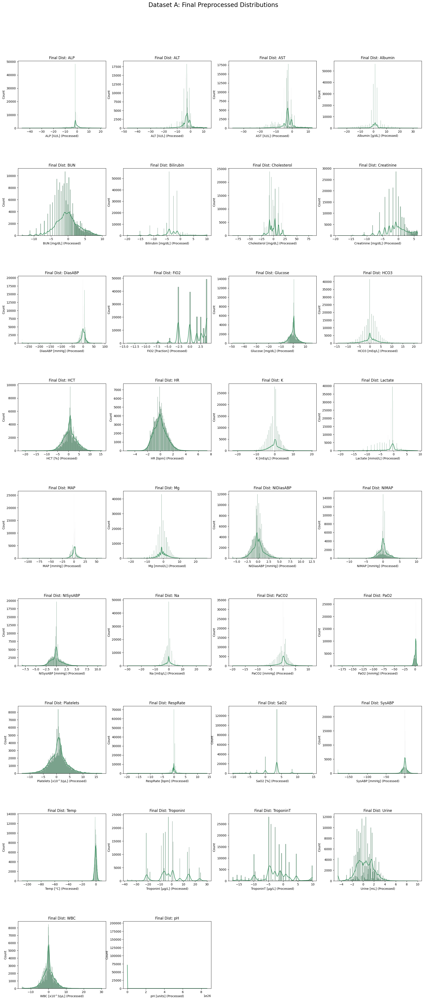

In [17]:
# Exclude identifiers and one-hot encoded categorical columns 
exclude = ['Timestamp', 'PatientID', 'Label', 'Age_Bin', 'Dataset', 'RecordID']
cat_prefixes = ('Gender_', 'ICUType_')
num_vars = [
    v for v in df_a_processed.columns 
    if v not in exclude and not v.startswith(cat_prefixes)
]
def plot_final_distributions(df, vars_to_plot, title):
    vars_to_plot = [v for v in vars_to_plot if v in df.columns]
    
    cols = 4
    rows = math.ceil(len(vars_to_plot) / cols)
    plt.figure(figsize=(24, 6 * rows))
    
    for i, var in enumerate(vars_to_plot, 1):
        ax = plt.subplot(rows, cols, i)
        
        # Drop NaNs 
        plot_data = df[var].dropna()
        
        sns.histplot(plot_data, kde=True, color='seagreen')
        
        # Safely fetch the unit if unit_map is defined
        unit = unit_map.get(var, '') if 'unit_map' in globals() else ''
        plt.xlabel(f"{var} [{unit}] (Processed)" if unit else f"{var} (Processed)")
        plt.title(f"Final Dist: {var}")
        
    plt.suptitle(title, fontsize=20, y=0.95)
    plt.subplots_adjust(hspace=0.6, top=0.90)
    plt.show()

plot_final_distributions(df_a_processed, ts_vars_numeric, "Dataset A: Final Preprocessed Distributions")

In [ ]:
# Load datasets B and C
df_b = pd.read_parquet(processed_datasets / 'processed_set_b.parquet')
df_c = pd.read_parquet(processed_datasets / 'processed_set_c.parquet')

# Transform datasets B and C using A's memorized statistics
print("Transforming Dataset B...")
df_b_processed = preprocessor.transform(df_b)
print("Transforming Dataset C...")
df_c_processed = preprocessor.transform(df_c)

# Save the cleaned datasets 
preprocessed_path = Path('output/preprocessed_imputed_datasets/')
preprocessed_path.mkdir(parents=True, exist_ok=True)

df_a_processed.to_parquet(preprocessed_path / 'preprocessed_set_a.parquet', index=False)
df_b_processed.to_parquet(preprocessed_path / 'preprocessed_set_b.parquet', index=False)
df_c_processed.to_parquet(preprocessed_path / 'preprocessed_set_c.parquet', index=False)
print("All datasets successfully processed and saved!")

Transforming Dataset B...
Transforming Dataset C...
All datasets successfully processed and saved!
